## 21BAI1176 SANNIDHYA PRADYUMNA MATE MACHINE VISION LAB ASSIGNMENT-1

#### 16th August 2024

https://github.com/sannidhya2003/Machine-Vision

## AS - 1 (a)

### Basic Image Statistics and Color Space Conversion

Blue Channel:
  Mean: 150.95
  Standard Deviation: 74.30


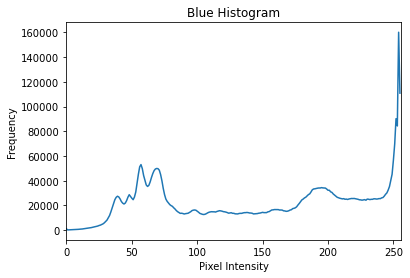

Green Channel:
  Mean: 133.56
  Standard Deviation: 66.32


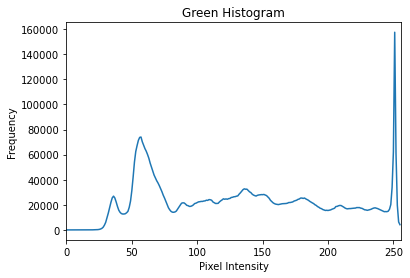

Red Channel:
  Mean: 103.19
  Standard Deviation: 68.95


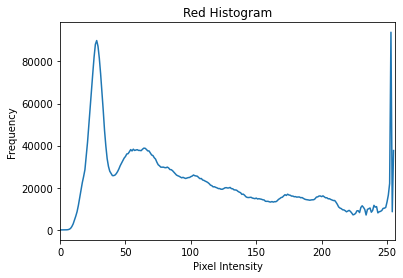

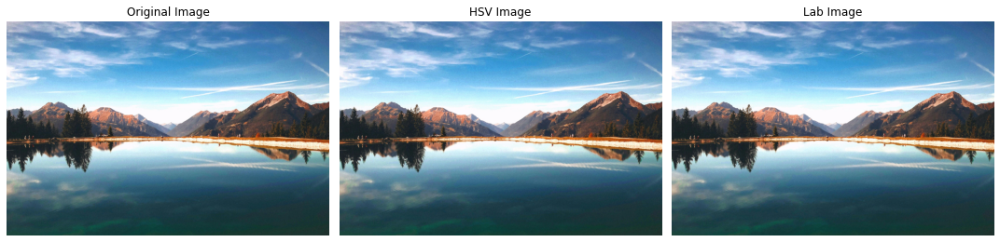

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
 
def compute_basic_statistics(image):
    """
    Compute basic statistics (mean, standard deviation, histogram) for each color channel.
    """
    channels = cv2.split(image)
    stats = {}
    for i, color in enumerate(['Blue', 'Green', 'Red']):
        channel = channels[i]
        mean = np.mean(channel)
        stddev = np.std(channel)
        histogram = cv2.calcHist([channel], [0], None, [256], [0, 256])
        stats[color] = {
            'Mean': mean,
            'Standard Deviation': stddev,
            'Histogram': histogram
        }
    return stats
 
def convert_color_spaces(image):
    """
    Convert the image to HSV and Lab color spaces.
    """
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)
    return hsv_image, lab_image
 
def display_images(original, hsv_image, lab_image):
    """
    Display the original image and its HSV and Lab color space conversions.
    """
    plt.figure(figsize=(15, 10))
    plt.subplot(1, 3, 1)
    plt.title('Original Image')
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.title('HSV Image')
    plt.imshow(cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB))
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.title('Lab Image')
    plt.imshow(cv2.cvtColor(lab_image, cv2.COLOR_Lab2RGB))
    plt.axis('off')
    plt.tight_layout()
    plt.show()
 
image_path = 'scene.jpg'  
image = cv2.imread(image_path)
 
if image is None:
    raise FileNotFoundError(f"The image at {image_path} could not be found.")
 
stats = compute_basic_statistics(image)
for color, values in stats.items():
    print(f"{color} Channel:")
    print(f"  Mean: {values['Mean']:.2f}")
    print(f"  Standard Deviation: {values['Standard Deviation']:.2f}")
    plt.figure(figsize=(6, 4))
    plt.title(f"{color} Histogram")
    plt.plot(values['Histogram'])
    plt.xlim([0, 256])
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.show()
 
hsv_image, lab_image = convert_color_spaces(image)
 
display_images(image, hsv_image, lab_image)

Observations and Inferences
#### Mean and Standard Deviation:

The mean values of each channel give us an idea of the average color intensity across the image. For example, higher mean values in the red channel might indicate that the image is generally reddish.

The standard deviation values tell us about the spread of the pixel intensities. A higher standard deviation means that the intensity values are more spread out, indicating more contrast within that channel.

#### Histogram Analysis:
The histograms for each color channel provide a distribution of pixel intensities. Peaks in the histogram represent the most common intensities, while wider distributions suggest a more varied intensity range.
For instance, if the blue channel histogram has a peak towards the higher intensities, the image might have a lot of bright blue areas.

#### Color Space Conversion (HSV and Lab):

HSV: The Hue-Saturation-Value color space is useful for color segmentation and manipulation tasks. Unlike RGB, HSV separates the color information (hue) from the intensity (value), making it easier to isolate colors. The converted HSV image might highlight color contrasts more prominently than the original.
Lab: The Lab color space is designed to approximate human vision. It separates the luminance (L) from the color components (a and b). Converting the image to Lab may reveal subtleties in brightness and color perception that are not obvious in RGB or HSV.

#### Inference:
Image Understanding: By analyzing the mean, standard deviation, and histograms, we can derive insights into the overall color distribution and contrast in the image. This information is valuable for image processing tasks such as thresholding, contrast enhancement, or segmentation.
Color Space Relevance: Each color space has its strengths. RGB is intuitive for display, HSV is great for isolating color information, and Lab is effective for processing tasks that require perceptual accuracy. Depending on the task, choosing the right color space is crucial for effective image manipulation.

### Simple Image Segmentation Using Thresholding

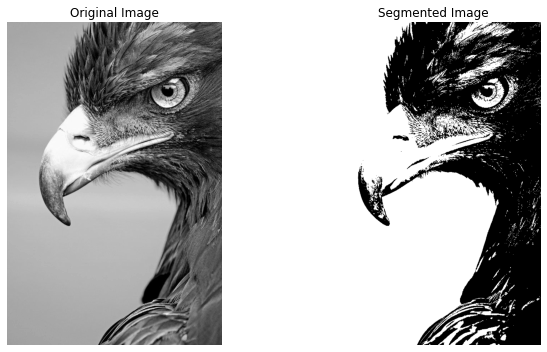

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image_path = 'eagle.jpg'  # Replace with your image path

image_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# 2. Apply Thresholding

threshold_value = 127
# Apply global thresholding
_, segmented_image = cv2.threshold(image_gray, threshold_value, 255, cv2.THRESH_BINARY)

# 3. Display Results
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image_gray, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Segmented Image')
plt.imshow(segmented_image, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


## Observations:
#### Thresholding:
The selected threshold successfully distinguished bright areas (objects) from the darker background. However, if the threshold isn't carefully chosen, some details can be lost, especially in images with varying intensity levels.

#### Binary Segmentation:
The resulting binary image emphasizes the regions of interest, making object isolation easier. Thresholding is effective for images with clear intensity contrasts but may face challenges with images where intensity values overlap.

### Color-Based Segmentation

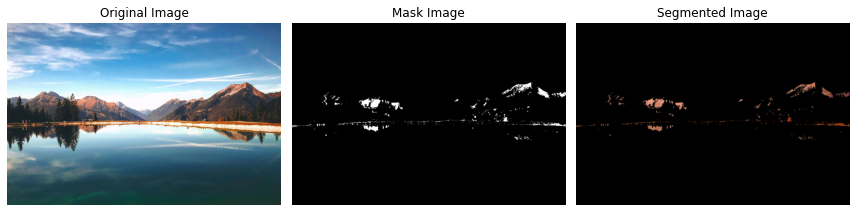

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image_path = 'scene.jpg'
image = cv2.imread(image_path)

# 2. Convert to HSV
image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# 3. Apply Color Thresholding

lower_bound = np.array([0, 100, 100])   # Lower bound for red color
upper_bound = np.array([10, 255, 255])  # Upper bound for red color

# Create a binary mask
mask = cv2.inRange(image_hsv, lower_bound, upper_bound)

# Apply the mask to the original image
segmented_image = cv2.bitwise_and(image, image, mask=mask)

plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Mask Image')
plt.imshow(mask, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Segmented Image')
plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
plt.axis('off')

plt.tight_layout()
plt.show()


## Insights:
#### HSV Color Space:
Using the HSV color space enabled more precise segmentation by decoupling color information (Hue) from brightness (Value). Objects with the target color were effectively segmented by applying appropriate thresholds to hue and saturation.

#### Color Thresholding:
This method proved highly efficient for segmenting objects with distinct and consistent colors. However, challenges may arise when dealing with objects that share similar hues or exhibit varying lighting conditions, requiring careful adjustment of thresholds.

#### Conclusion:
Segmentation based on color using the HSV color space is a robust approach for isolating objects based on their color properties. It offers greater accuracy than direct RGB thresholding

# AS - 1 (b)

### Image Negative Transformation

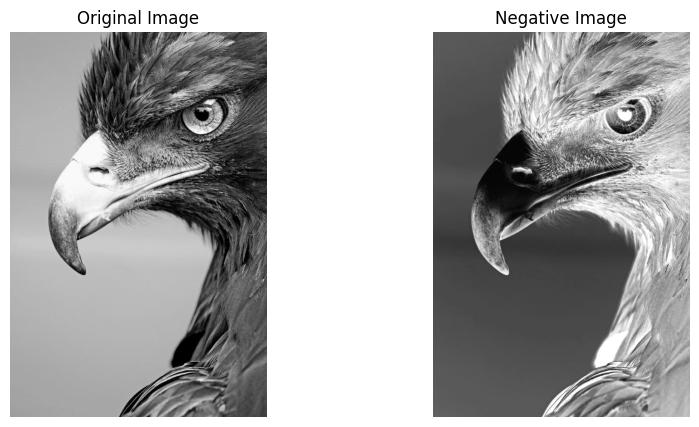

In [1]:
import cv2
from matplotlib import pyplot as plt

image_path = 'eagle.jpg'  # Replace with the path to your grayscale image
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)


if original_image is None:
    raise ValueError("Image not found or unable to load. Please check the path.")

negative_image = 255 - original_image

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(original_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Negative Image')
plt.imshow(negative_image, cmap='gray')
plt.axis('off')

plt.show()

### Gamma Correction

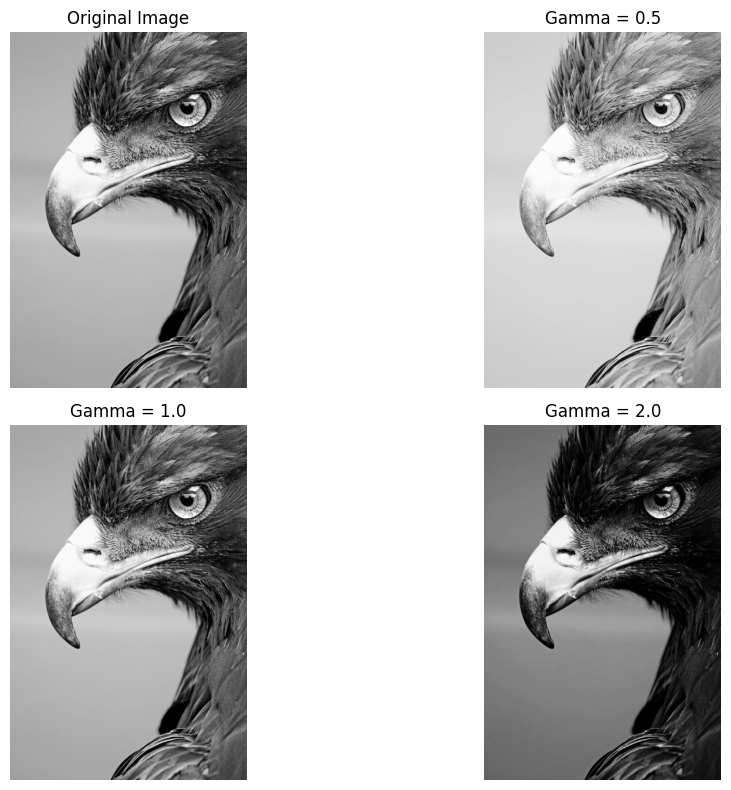

In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def apply_gamma_correction(image, gamma):
    
    normalized_image = image / 255.0
    corrected_image = np.power(normalized_image, gamma) * 255
    return np.uint8(corrected_image)

# Load a grayscale image
image_path = 'eagle.jpg'  # Replace with your image path
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if original_image is None:
    raise ValueError("Image not found or unable to load. Please check the path.")

# Apply gamma correction
gamma_values = [0.5, 1.0, 2.0]
corrected_images = [apply_gamma_correction(original_image, gamma) for gamma in gamma_values]

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.title('Original Image')
plt.imshow(original_image, cmap='gray')
plt.axis('off')

for i, gamma in enumerate(gamma_values):
    plt.subplot(2, 2, i + 2)
    plt.title(f'Gamma = {gamma}')
    plt.imshow(corrected_images[i], cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

### Log Transform

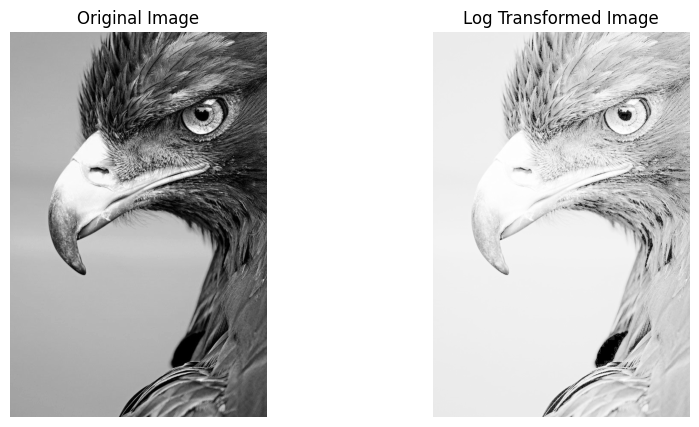

In [3]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def apply_log_transformation(image):
    # Convert image to float32
    image_float = np.float32(image)
    
    # Compute the scaling constant
    c = 255 / np.log(1 + np.max(image_float))
    
    # Apply the log transformation
    log_transformed = c * np.log(1 + image_float)
    
    log_transformed = np.uint8(np.clip(log_transformed, 0, 255))
    
    return log_transformed

# Load a grayscale image
image_path = 'eagle.jpg'  # Replace with the path to your grayscale image
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if original_image is None:
    raise ValueError("Image not found or unable to load. Please check the path.")

# Apply log transformation
log_transformed_image = apply_log_transformation(original_image)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(original_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Log Transformed Image')
plt.imshow(log_transformed_image, cmap='gray')
plt.axis('off')

plt.show()

### Compare Transforms

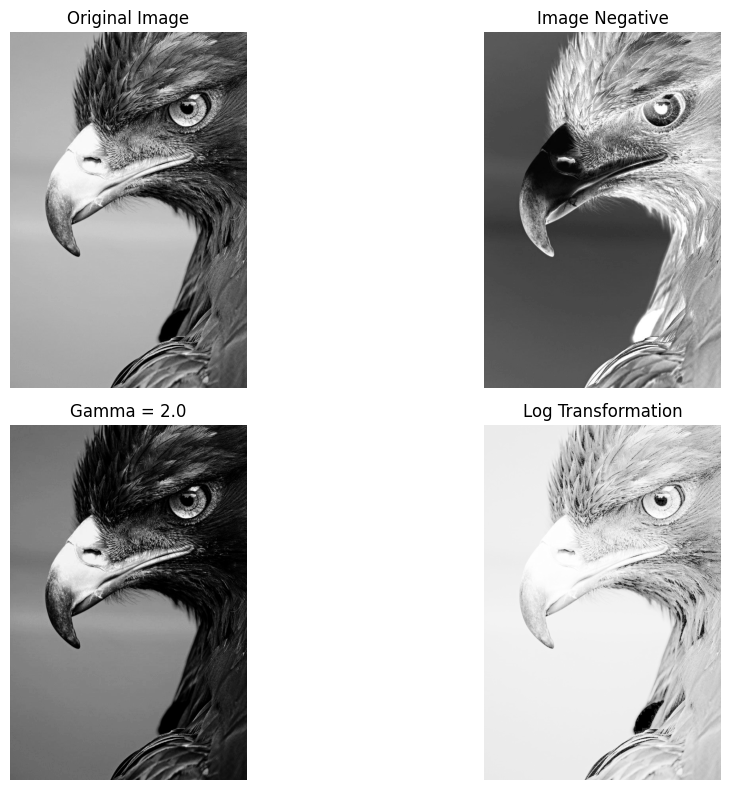

In [4]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def apply_gamma_correction(image, gamma):

    normalized_image = image / 255.0
    corrected_image = np.power(normalized_image, gamma) * 255
    return np.uint8(corrected_image)

def apply_log_transformation(image):
    # Convert image to float32
    image_float = np.float32(image)
    
    # Compute the scaling constant
    c = 255 / np.log(1 + np.max(image_float))
    
    # Apply the log transformation
    log_transformed = c * np.log(1 + image_float)
    
    # Convert back to uint8
    log_transformed = np.uint8(np.clip(log_transformed, 0, 255))
    
    return log_transformed

def apply_image_negative(image):
    # Compute the negative of the image
    return 255 - image

# Load a grayscale image
image_path = 'eagle.jpg'  # Replace with the path to your grayscale image
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if original_image is None:
    raise ValueError("Image not found or unable to load. Please check the path.")

# Apply transformations
gamma_value = 2.0
gamma_corrected_image = apply_gamma_correction(original_image, gamma_value)
log_transformed_image = apply_log_transformation(original_image)
negative_image = apply_image_negative(original_image)

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.title('Original Image')
plt.imshow(original_image, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Image Negative')
plt.imshow(negative_image, cmap='gray')
plt.axis('off')

# gamma-corrected image
plt.subplot(2, 2, 3)
plt.title(f'Gamma = {gamma_value}')
plt.imshow(gamma_corrected_image, cmap='gray')
plt.axis('off')

# log-transformed image
plt.subplot(2, 2, 4)
plt.title('Log Transformation')
plt.imshow(log_transformed_image, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

## Observations:
Image Negative: This transformation inverts the pixel intensities, turning dark regions into light and vice versa. It is especially useful for enhancing details in dark regions of the image.

Gamma Correction (γ = 2.0): This operation compresses the pixel intensity range, making darker regions appear even darker and slightly enhancing bright regions. It reduces contrast in mid-tones but increases contrast in shadows and highlights.

Log Transformation: The log transformation stretches the intensity range of lower pixel values, enhancing details in the darker regions while compressing the brighter areas. This is particularly effective in images with large intensity variations.

## Inference:
Image Negative: The negative transformation is useful for highlighting details in darker regions by reversing the intensities. It provides an inverse perspective of the image.

Gamma Correction: Gamma correction controls the brightness of the image and can be tailored to enhance specific regions. For a gamma value of 2.0, darker regions become more prominent, while lighter regions retain some brightness, making this method effective for images that need contrast adjustment.

Log Transformation: Log transformation enhances low-intensity regions and suppresses high-intensity areas, making it a powerful tool for enhancing details in images with high dynamic range. It is effective for improving visibility in darker regions of an image.

### Apply Transformations to Colour Images 

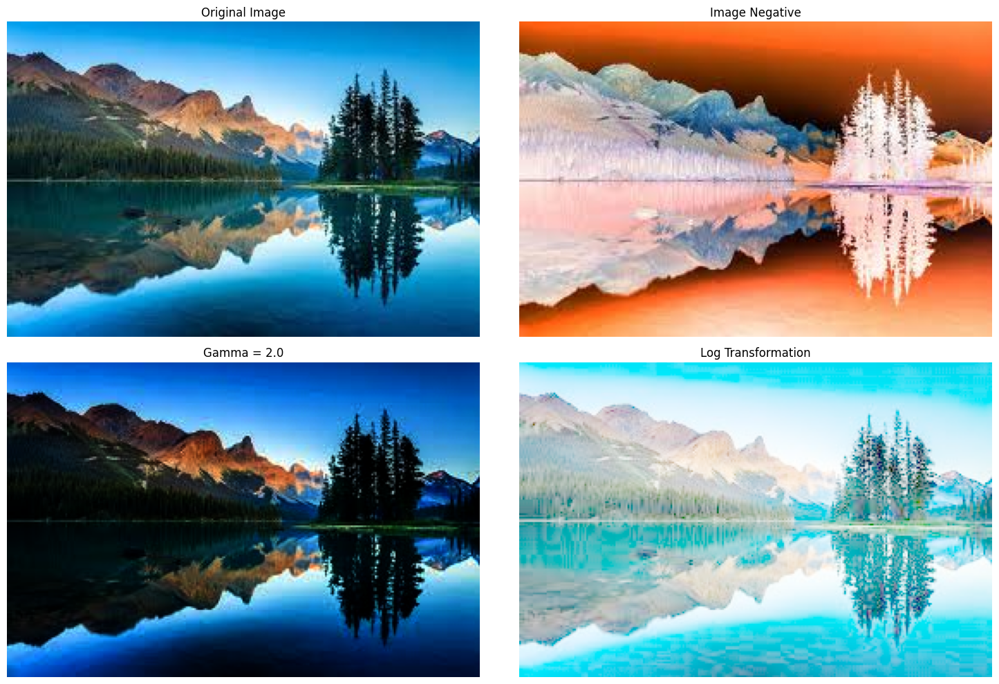

In [6]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def apply_gamma_correction(image, gamma):
    
    normalized_image = image / 255.0
    corrected_image = np.power(normalized_image, gamma) * 255
    return np.uint8(corrected_image)

def apply_log_transformation(image):
    # Convert image to float32
    image_float = np.float32(image)
    
    # Compute the scaling constant
    c = 255 / np.log(1 + np.max(image_float))
    
    # Apply the log transformation
    log_transformed = c * np.log(1 + image_float)
    
    # Convert back to uint8
    log_transformed = np.uint8(np.clip(log_transformed, 0, 255))
    
    return log_transformed

def apply_image_negative(image):
    return 255 - image

def process_color_image(image, gamma):
    # Split the image into its R, G, B channels
    b_channel, g_channel, r_channel = cv2.split(image)
    
    # Apply transformations to each channel
    r_neg = apply_image_negative(r_channel)
    g_neg = apply_image_negative(g_channel)
    b_neg = apply_image_negative(b_channel)
    
    r_gamma = apply_gamma_correction(r_channel, gamma)
    g_gamma = apply_gamma_correction(g_channel, gamma)
    b_gamma = apply_gamma_correction(b_channel, gamma)
    
    r_log = apply_log_transformation(r_channel)
    g_log = apply_log_transformation(g_channel)
    b_log = apply_log_transformation(b_channel)
    
    # Merge the channels
    neg_image = cv2.merge([b_neg, g_neg, r_neg])
    gamma_image = cv2.merge([b_gamma, g_gamma, r_gamma])
    log_image = cv2.merge([b_log, g_log, r_log])
    
    return neg_image, gamma_image, log_image

image_path = 'scene.jpeg'  # Replace with the path to your color image
original_image = cv2.imread(image_path)

if original_image is None:
    raise ValueError("Image not found or unable to load. Please check the path.")

# gamma value
gamma_value = 2.0

# Apply transformations
negative_image, gamma_image, log_image = process_color_image(original_image, gamma_value)

plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Image Negative')
plt.imshow(cv2.cvtColor(negative_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 2, 3)
plt.title(f'Gamma = {gamma_value}')
plt.imshow(cv2.cvtColor(gamma_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 2, 4)
plt.title('Log Transformation')
plt.imshow(cv2.cvtColor(log_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

## Observations:
Image Negative: Applying the negative transformation to each channel inverts the colors of the image. This makes light areas appear dark and vice versa, while also altering the color tones. The resulting image shows a completely reversed color palette, which can help in certain visualization tasks.

Gamma Correction (γ = 2.0): The gamma correction, when applied to each channel, darkens the image, with shadows becoming more prominent. This transformation is effective for reducing the brightness in images where colors need to be toned down or when there is a need to focus on darker regions. The transformation makes mid-tones appear less contrasted.

Log Transformation: Log transformation enhances the color details in darker areas of the image while compressing the brighter regions. This transformation is particularly useful for images with a high dynamic range, as it helps reveal more details in areas that might otherwise be too dark to observe.

# AS - 1 (c)

### Introduction to Histogram Equalization

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to display images in the notebook
def display_image_with_histogram(image, title):
    plt.figure(figsize=(12, 6))
    
    # Display the image
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title(title)
    plt.axis('off')
    
    # Plot the histogram
    plt.subplot(1, 2, 2)
    plt.hist(image.ravel(), 256, [0, 256])
    plt.title(f'Histogram of {title}')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    
    plt.show()

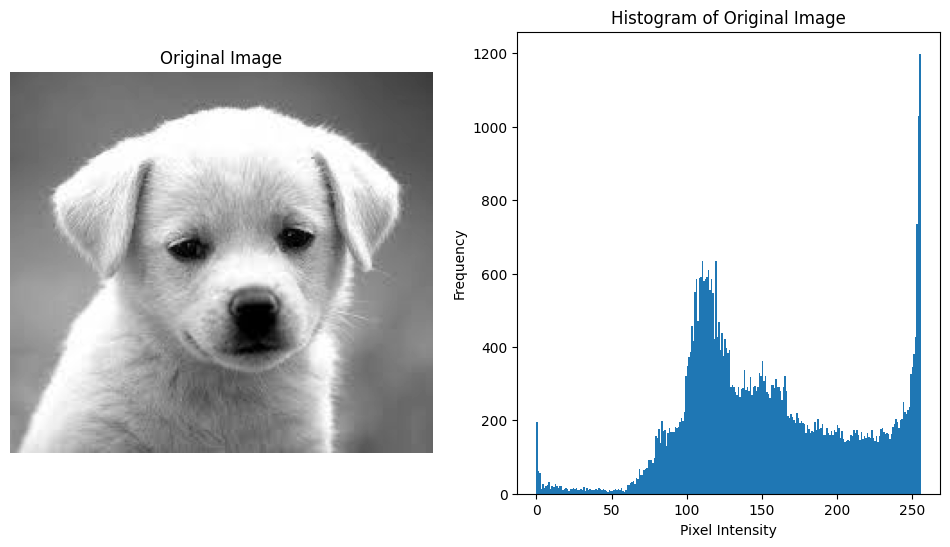

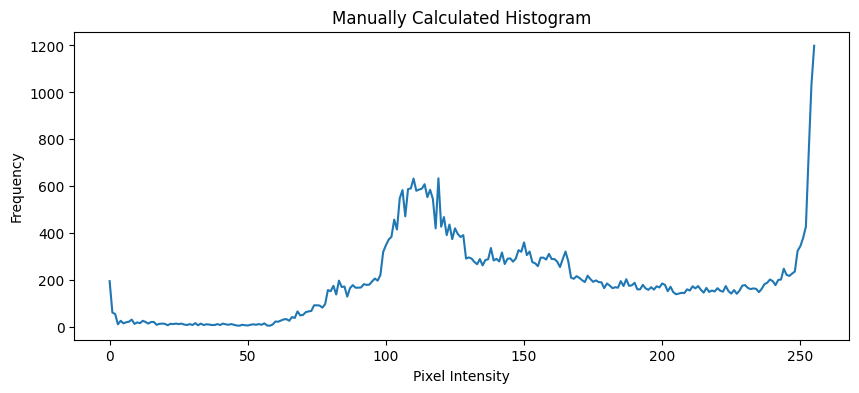

In [8]:
# 1. Load a grayscale image
image = cv2.imread('puppy.jpeg', cv2.IMREAD_GRAYSCALE)

# Display the original image and its histogram
display_image_with_histogram(image, 'Original Image')

# 2. Calculate and plot histogram manually
hist, bins = np.histogram(image.flatten(), 256, [0, 256])

# Plot manually calculated histogram
plt.figure(figsize=(10, 4))
plt.plot(hist)
plt.title('Manually Calculated Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()

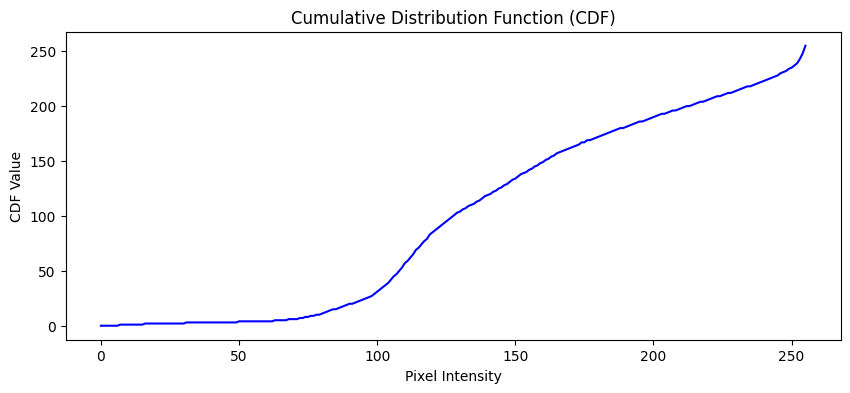

In [9]:
# 3. Calculate Cumulative Distribution Function (CDF)
cdf = hist.cumsum()  # Compute cumulative sum
cdf_min = cdf.min()
cdf_normalized = ((cdf - cdf_min) * 255 / (cdf.max() - cdf_min)).astype('uint8')  # Normalize CDF

# Plot the CDF
plt.figure(figsize=(10, 4))
plt.plot(cdf_normalized, color='b')
plt.title('Cumulative Distribution Function (CDF)')
plt.xlabel('Pixel Intensity')
plt.ylabel('CDF Value')
plt.show()

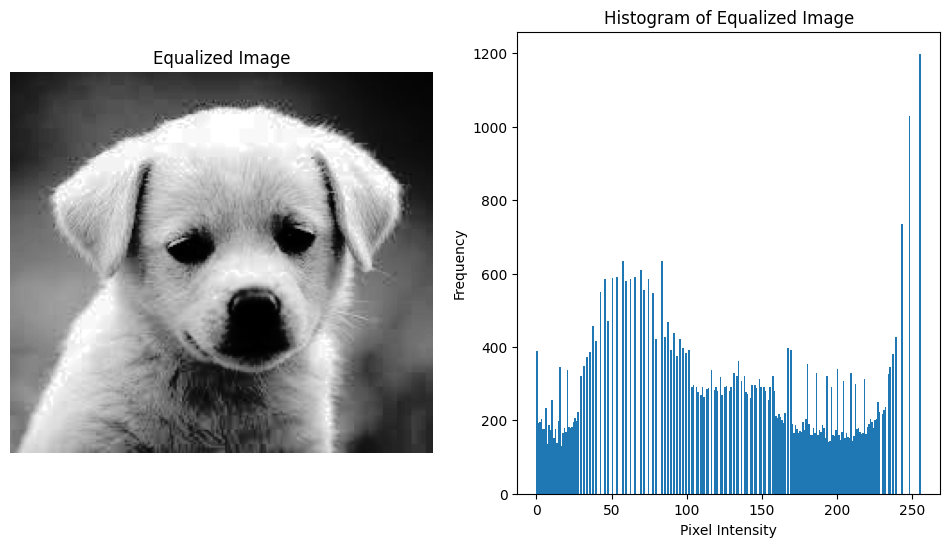

In [10]:
# 4. Apply Histogram Equalization
equalized_image = cdf_normalized[image]

# Display the equalized image and its histogram
display_image_with_histogram(equalized_image, 'Equalized Image')

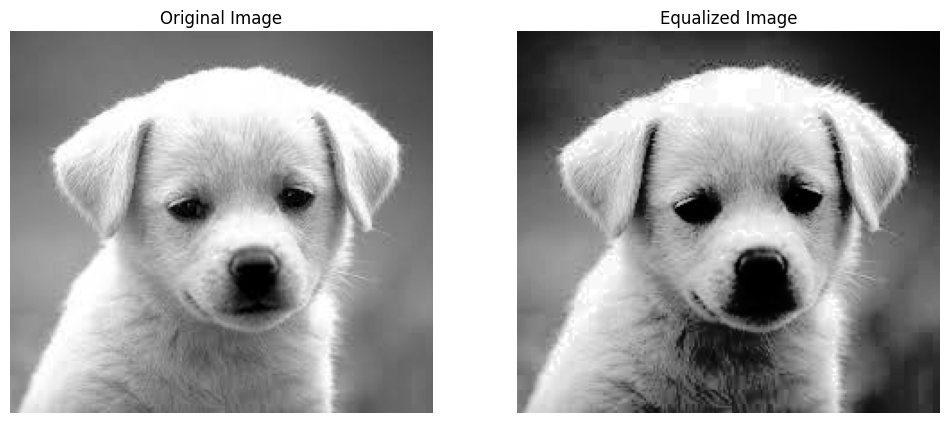

In [11]:
# 5. Compare Original and Equalized Images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

plt.show()

### Comparing Histogram Equalization Techniques

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to display images and their histograms
def display_images_with_histograms(images, titles):
    plt.figure(figsize=(20, 10))
    
    for i, (image, title) in enumerate(zip(images, titles)):
        plt.subplot(len(images), 2, i * 2 + 1)
        plt.imshow(image, cmap='gray')
        plt.title(title)
        plt.axis('off')
        
        plt.subplot(len(images), 2, i * 2 + 2)
        plt.hist(image.ravel(), 256, [0, 256])
        plt.title(f'Histogram of {title}')
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()

In [13]:
# Load the grayscale image
image = cv2.imread('puppy.jpeg', cv2.IMREAD_GRAYSCALE)

# 1. Standard Histogram Equalization
equalized_image = cv2.equalizeHist(image)

# 2. Adaptive Histogram Equalization (AHE)
# Divide the image into tiles and apply histogram equalization to each tile
tile_size = 8  # Tile size can be changed
height, width = image.shape
ahe_image = np.zeros_like(image)

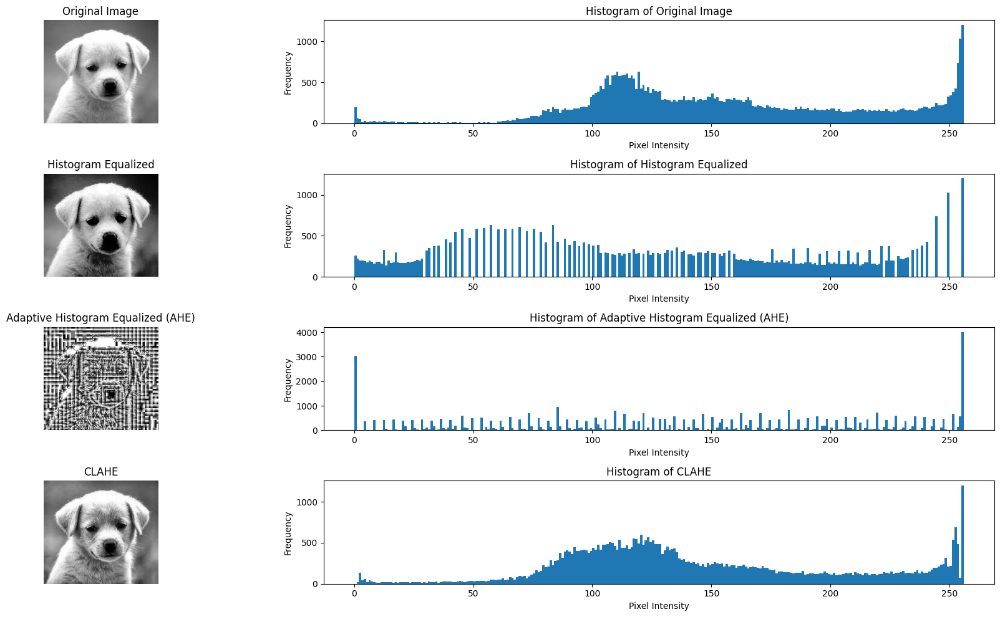

In [14]:
for i in range(0, height, tile_size):
    for j in range(0, width, tile_size):
        tile = image[i:i + tile_size, j:j + tile_size]
        equalized_tile = cv2.equalizeHist(tile)
        ahe_image[i:i + tile_size, j:j + tile_size] = equalized_tile

# 3. Contrast Limited Adaptive Histogram Equalization (CLAHE)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_image = clahe.apply(image)

# 4. Compare Results with Histograms
images = [image, equalized_image, ahe_image, clahe_image]
titles = ['Original Image', 'Histogram Equalized', 'Adaptive Histogram Equalized (AHE)', 'CLAHE']

display_images_with_histograms(images, titles)

### Implementing Histogram Equalization on Color Images

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to display images side by side with their histograms
def display_images_with_histograms(images, titles, channels=None):
    plt.figure(figsize=(20, 10))
    
    for i, (image, title) in enumerate(zip(images, titles)):
        # Display the image
        plt.subplot(len(images), 2, i * 2 + 1)
        if channels:
            plt.imshow(image, cmap='gray')
        else:
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis('off')
        
        # Display the histogram
        plt.subplot(len(images), 2, i * 2 + 2)
        if channels:
            plt.hist(image.ravel(), 256, [0, 256], color=channels[i])
        else:
            colors = ('b', 'g', 'r')
            for j, color in enumerate(colors):
                histogram = cv2.calcHist([image], [j], None, [256], [0, 256])
                plt.plot(histogram, color=color)
        plt.title(f'Histogram of {title}')
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()

In [16]:
# 1. Load the color image
image = cv2.imread('nature.jpeg')  # Load the image in color

# 2. Separate Color Channels (RGB)
b_channel, g_channel, r_channel = cv2.split(image)

# 3. Apply Histogram Equalization to Each Channel
equalized_r = cv2.equalizeHist(r_channel)
equalized_g = cv2.equalizeHist(g_channel)
equalized_b = cv2.equalizeHist(b_channel)

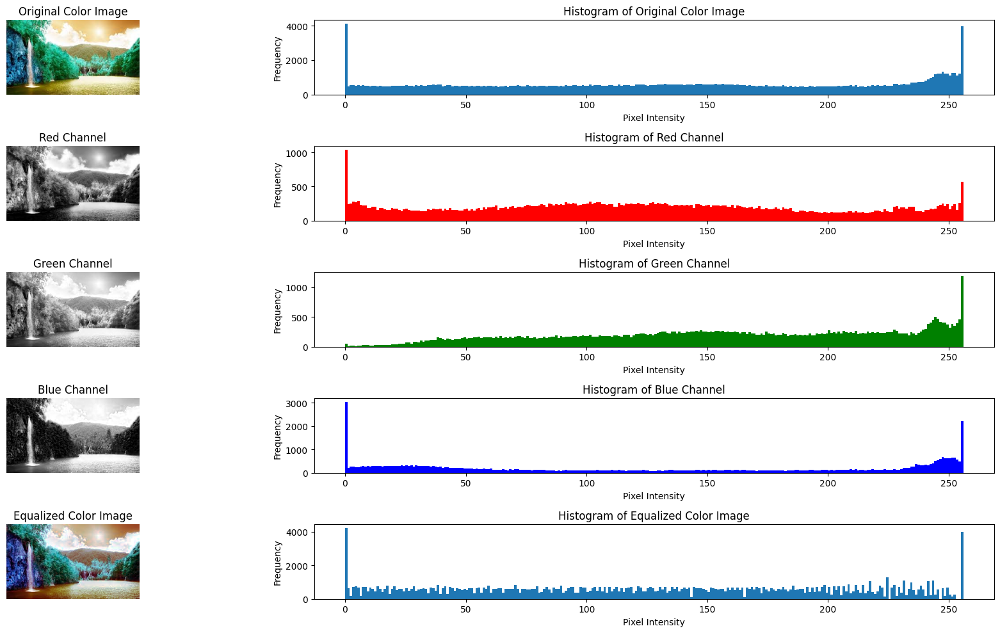

In [17]:
# 4. Reconstruct the Color Image
equalized_image = cv2.merge((equalized_b, equalized_g, equalized_r))

# 5. Display images and their histograms
images = [image, r_channel, g_channel, b_channel, equalized_image]
titles = ['Original Color Image', 'Red Channel', 'Green Channel', 'Blue Channel', 'Equalized Color Image']
channels = [None, 'r', 'g', 'b', None]

display_images_with_histograms(images, titles, channels)

### Histogram Equalization in Different Applications

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def equalize_hist(image):


    if len(image.shape) != 2:
        raise ValueError("Input image must be grayscale.")

    histogram, bins = np.histogram(image.flatten(), bins=256, range=[0, 256])

    # Compute Cumulative Distribution Function (CDF)
    cdf = np.cumsum(histogram)
    cdf_normalized = cdf * (255 / cdf[-1])  

    equalized_image = np.interp(image.flatten(), bins[:-1], cdf_normalized).reshape(image.shape).astype(np.uint8)

    return equalized_image

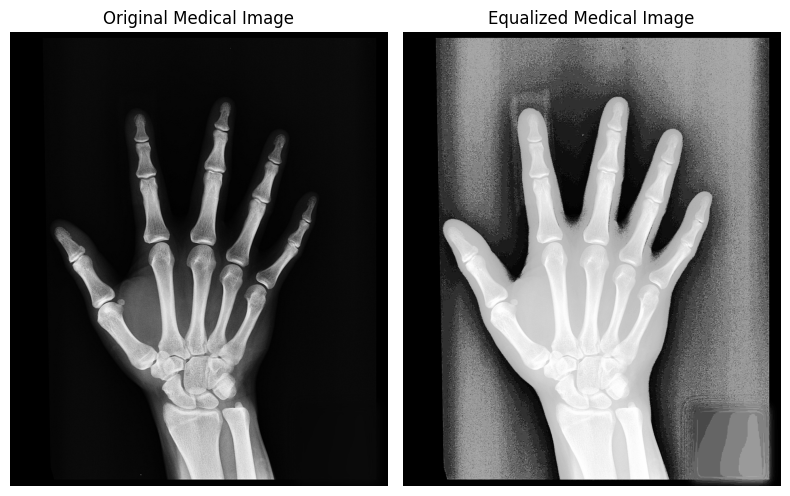

In [28]:
# 1. Medical Imaging

medical_image = cv2.imread("xray.jpg", 0)  # Replace with your image file

# Apply histogram equalization
equalized_medical_image = equalize_hist(medical_image)

# Display the results
plt.figure(figsize=(8, 6))

plt.subplot(1, 2, 1)
plt.imshow(medical_image, cmap='gray')
plt.title('Original Medical Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_medical_image, cmap='gray')
plt.title('Equalized Medical Image')
plt.axis('off')

plt.tight_layout()
plt.show()

##### Histogram equalization can improve the visibility of features like fractures or lesions by boosting the contrast between various tissues. This technique can bring out subtle details, making them more noticeable and helping in diagnosis and analysis.

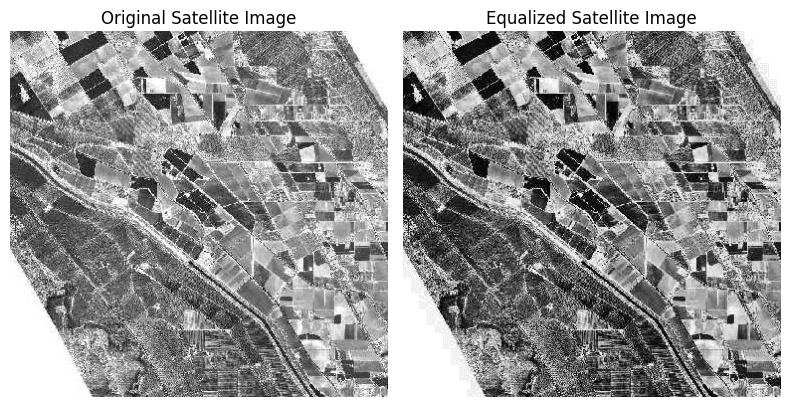

In [27]:
# Load a satellite image
satellite_image = cv2.imread("satellite.png")

satellite_image_gray = cv2.cvtColor(satellite_image, cv2.COLOR_BGR2GRAY)

equalized_satellite_image = equalize_hist(satellite_image_gray)

# Display the results
plt.figure(figsize=(8, 6))

plt.subplot(1, 2, 1)
plt.imshow(satellite_image_gray, cmap='gray')
plt.title('Original Satellite Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_satellite_image, cmap='gray')
plt.title('Equalized Satellite Image')
plt.axis('off')

plt.tight_layout()
plt.show()

##### Histogram Equalizations helps enhance the terrain bodies and make them more clearly visible by the satellite.

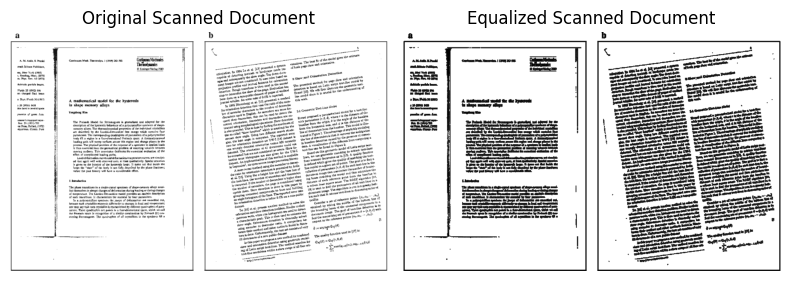

In [29]:
# Load a scanned document
document_image = cv2.imread("document.png", 0)  # Replace with your image file

equalized_document_image = equalize_hist(document_image)

# Display the results
plt.figure(figsize=(8, 6))

plt.subplot(1, 2, 1)
plt.imshow(document_image, cmap='gray')
plt.title('Original Scanned Document')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_document_image, cmap='gray')
plt.title('Equalized Scanned Document')
plt.axis('off')

plt.tight_layout()
plt.show()

##### Histogram equalization can make text and other document features stand out more clearly.

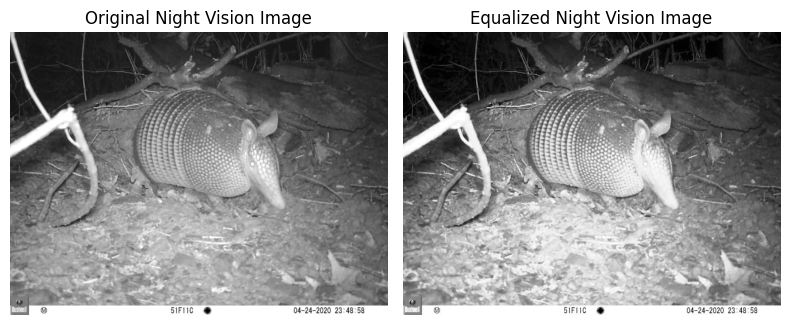

In [31]:
# Load a night vision image
night_vision_image = cv2.imread("night.jpg", 0)  

equalized_night_vision_image = equalize_hist(night_vision_image)

# Display the results
plt.figure(figsize=(8, 6))

plt.subplot(1, 2, 1)
plt.imshow(night_vision_image, cmap='gray')
plt.title('Original Night Vision Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_night_vision_image, cmap='gray')
plt.title('Equalized Night Vision Image')
plt.axis('off')

plt.tight_layout()
plt.show()

##### Histogram equalization can enhance details in night vision images by improving contrast

### Histogram Equalization for Low Contrast Images

In [32]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to display images and their histograms
def display_image_and_histogram(image, title):
    plt.figure(figsize=(10, 5))
    
    # Display the image
    plt.subplot(1, 2, 1)
    if len(image.shape) == 2:  # Grayscale image
        plt.imshow(image, cmap='gray')
    else:  # Color image
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    
    # Display the histogram
    plt.subplot(1, 2, 2)
    plt.hist(image.ravel(), 256, [0, 256])
    plt.title(f'Histogram of {title}')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()

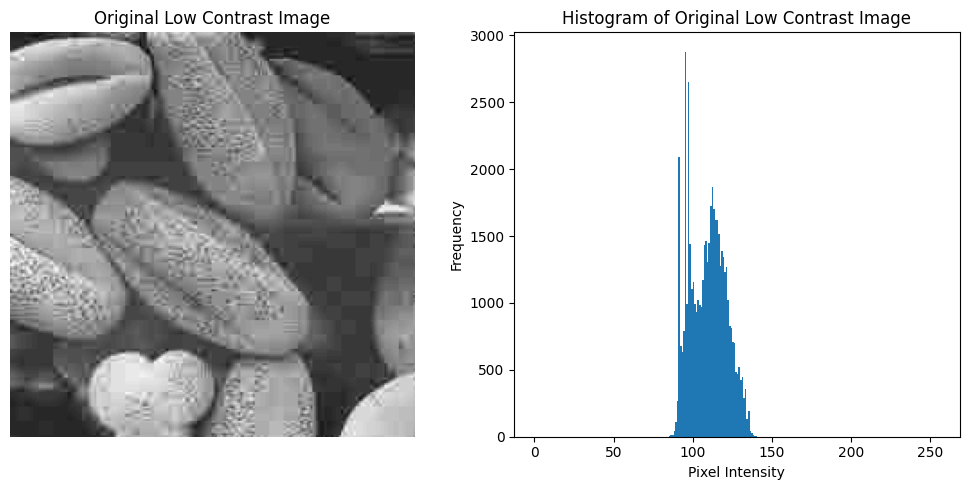

In [33]:
# Load a low contrast image in grayscale
low_contrast_image = cv2.imread('lowcontrast.jpg', cv2.IMREAD_GRAYSCALE)

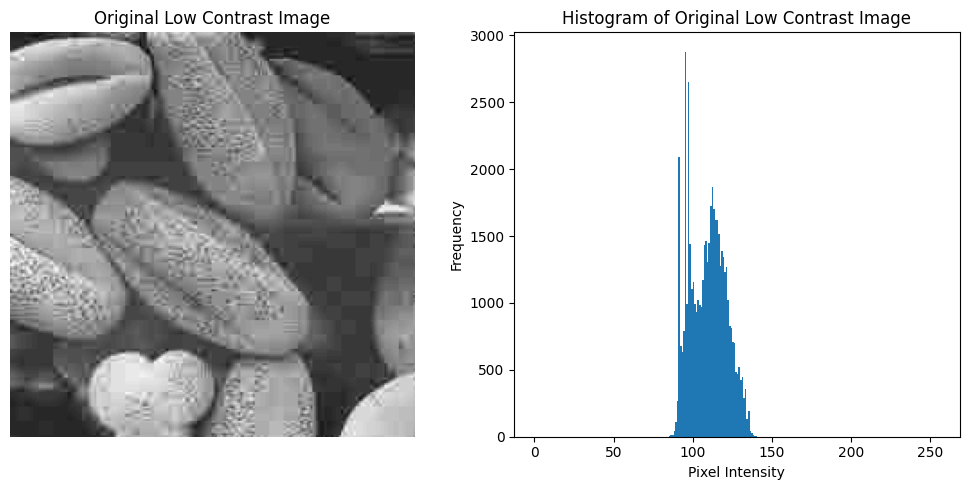

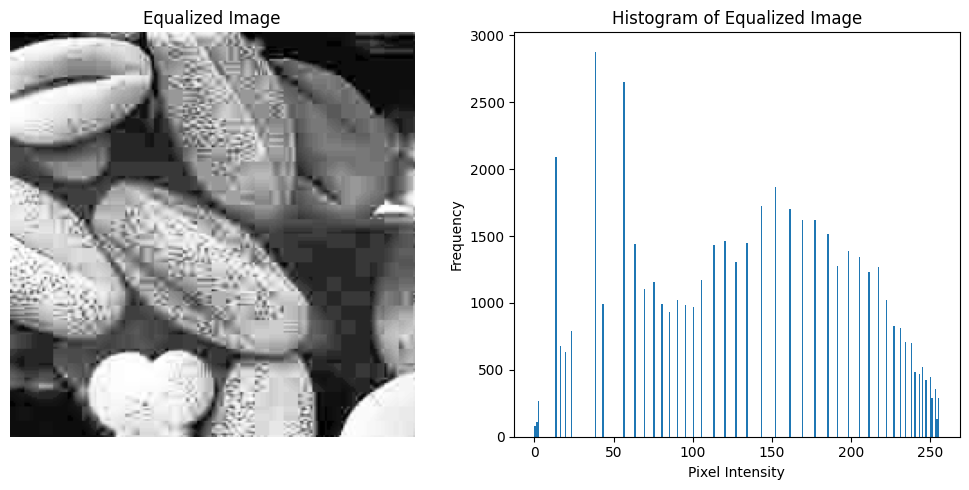

In [36]:
if low_contrast_image is None:
    print("Error: Image could not be loaded. Please check the path.")
else:
    # Display the original low contrast image and its histogram
    display_image_and_histogram(low_contrast_image, 'Original Low Contrast Image')

# 2. Apply Histogram Equalization
    equalized_image = cv2.equalizeHist(low_contrast_image)

    # Display the equalized image and its histogram
    display_image_and_histogram(equalized_image, 'Equalized Image')

##### Histogram equalization addresses low contrast issues by redistributing the pixel intensity values across the entire range of possible values, which enhances the contrast of the image. Here's how it works:

Uniform Intensity Distribution: In low contrast images, pixel intensities are concentrated in a narrow range, leading to limited differentiation between features. This lack of contrast can obscure important details.

In summary, histogram equalization enhances image contrast by redistributing pixel intensities, making subtle features more distinct and visible, which is particularly useful for analyzing low contrast images.

### Multi-Scale Histogram Equalization

In [37]:
import cv2
import matplotlib.pyplot as plt

# Function to display images
def display_images(images, titles):
    plt.figure(figsize=(15, 5))
    for i, (image, title) in enumerate(zip(images, titles)):
        plt.subplot(1, len(images), i + 1)
        if len(image.shape) == 2:  # Grayscale image
            plt.imshow(image, cmap='gray')
        else:  # Color image
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis('off')
    plt.show()

In [38]:
def resize_and_equalize(image, scale):
    # Resize the image
    resized_image = cv2.resize(image, None, fx=scale, fy=scale, interpolation=cv2.INTER_LINEAR)
    
    # Apply histogram equalization
    equalized_image = cv2.equalizeHist(resized_image)
    
    return equalized_image

image_path = 'eagle.jpg'  # Replace with the path to your image
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

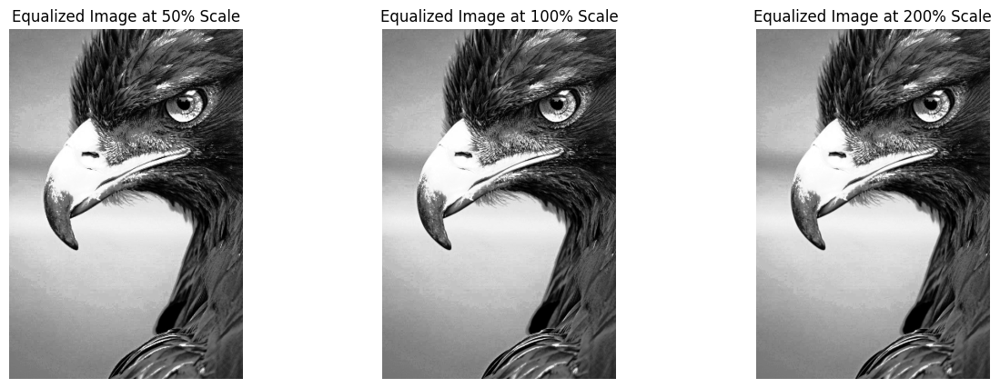

In [39]:
if original_image is None:
    print("Error: Image could not be loaded. Please check the path.")
else:
    # Define scales (50%, 100%, 200%)
    scales = [0.5, 1.0, 2.0]
    scale_titles = ['Equalized Image at 50% Scale', 'Equalized Image at 100% Scale', 'Equalized Image at 200% Scale']
    
    equalized_images = []
    
    for scale in scales:
        equalized_image = resize_and_equalize(original_image, scale)
        equalized_images.append(equalized_image)
    
    # Display the equalized images at different scales
    display_images(equalized_images, scale_titles)

#### Scale Effects on Histogram Equalization:

Rescaling the Image:

50% Scale: Reducing the image size to 50% decreases the number of pixels and may smooth out fine details. Histogram equalization at this scale can amplify differences between broader regions but may lose some fine detail due to reduced resolution.

100% Scale: Applying histogram equalization at the original scale preserves the image’s detail and spatial resolution. The equalization process will enhance contrast while maintaining the integrity of finer details.

200% Scale: Enlarging the image to 200% increases pixel dimensions, which can make details appear larger but may introduce artifacts or blurriness. Histogram equalization at this scale might exaggerate the contrast between features, but it can also amplify noise and distortions.

Scale affects histogram equalization results by influencing how pixel intensity distributions are spread and how details are preserved or altered. Smaller scales might enhance broader contrasts but reduce detail clarity, while larger scales may exaggerate contrasts and introduce artifacts. Applying histogram equalization at the original scale usually provides the most balanced contrast enhancement without distorting fine details.


### Histogram Equalization for Image Enhancement

In [40]:
import cv2
import matplotlib.pyplot as plt

# Function to display images side by side
def display_images_side_by_side(original_images, equalized_images, titles):
    plt.figure(figsize=(15, 10))
    num_images = len(original_images)
    
    for i in range(num_images):
        # Display original image
        plt.subplot(num_images, 2, i * 2 + 1)
        plt.imshow(cv2.cvtColor(original_images[i], cv2.COLOR_BGR2RGB))
        plt.title(f'Original {titles[i]}')
        plt.axis('off')
        
        # Display equalized image
        plt.subplot(num_images, 2, i * 2 + 2)
        plt.imshow(cv2.cvtColor(equalized_images[i], cv2.COLOR_BGR2RGB))
        plt.title(f'Equalized {titles[i]}')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

In [41]:
def apply_histogram_equalization(image):
    if len(image.shape) == 3:  # Color image
        # Convert to YUV color space
        yuv_image = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
        # Apply histogram equalization on the Y channel
        yuv_image[:,:,0] = cv2.equalizeHist(yuv_image[:,:,0])
        # Convert back to BGR color space
        equalized_image = cv2.cvtColor(yuv_image, cv2.COLOR_YUV2BGR)
    else:  # Grayscale image
        equalized_image = cv2.equalizeHist(image)
    
    return equalized_image

# Paths to the images
image_paths = ['lowcontrast.jpg', 'highcontrast.jpg', 'eagle.jpg']  # Replace with your image paths
titles = ['Low Contrast Image', 'High Contrast Image', 'Moderate Contrast Image']  # Titles for the images

original_images = []
equalized_images = []

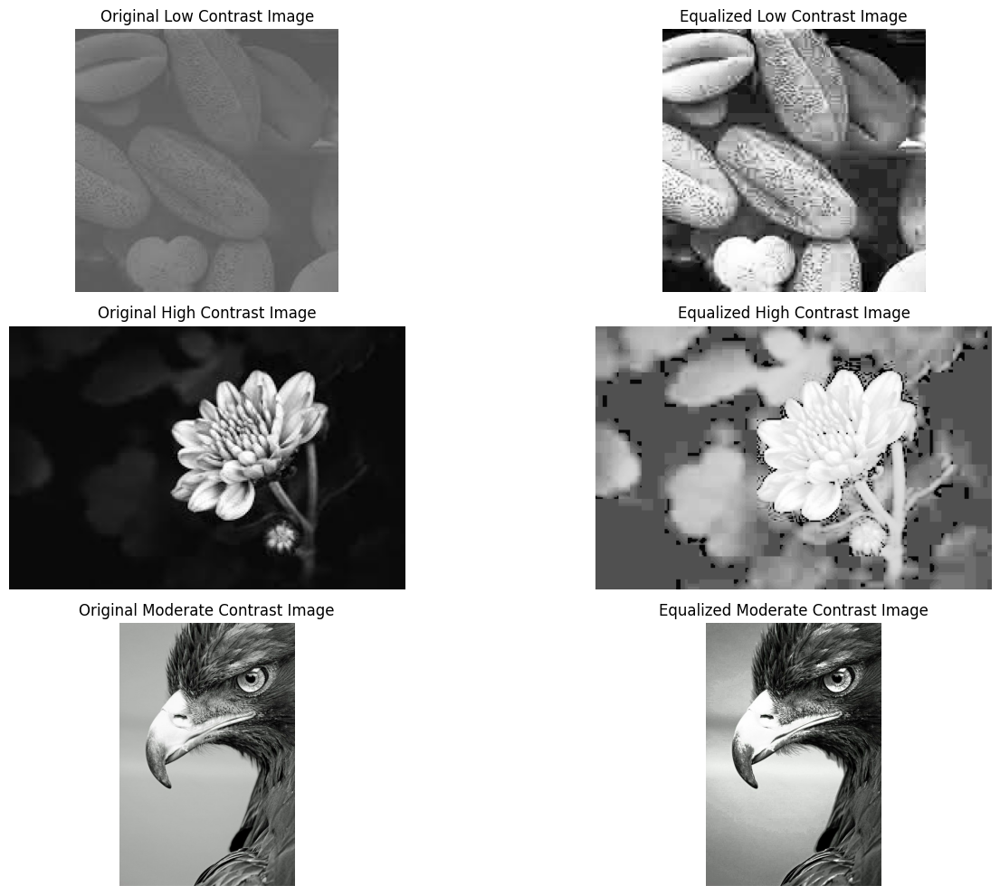

In [42]:
for path in image_paths:
    # Load each image
    image = cv2.imread(path)
    if image is not None:
        original_images.append(image)
        # Apply histogram equalization
        equalized_image = apply_histogram_equalization(image)
        equalized_images.append(equalized_image)
    else:
        print(f"Error: Image {path} could not be loaded. Please check the path.")

display_images_side_by_side(original_images, equalized_images, titles)

#### How Histogram Equalization Enhances Visual Analysis:
Revealed Details: By redistributing intensity values, histogram equalization uncovers details that were obscured by low contrast.

Increased Clarity: For high contrast images, it enhances the visibility of features in both shadows and highlights, making them more distinguishable.

Uniform Enhancement: In images with moderate contrast, histogram equalization consistently improves contrast across the entire image, resulting in a more uniform enhancement of overall quality.

### : Histogram Equalization in Image Segmentation

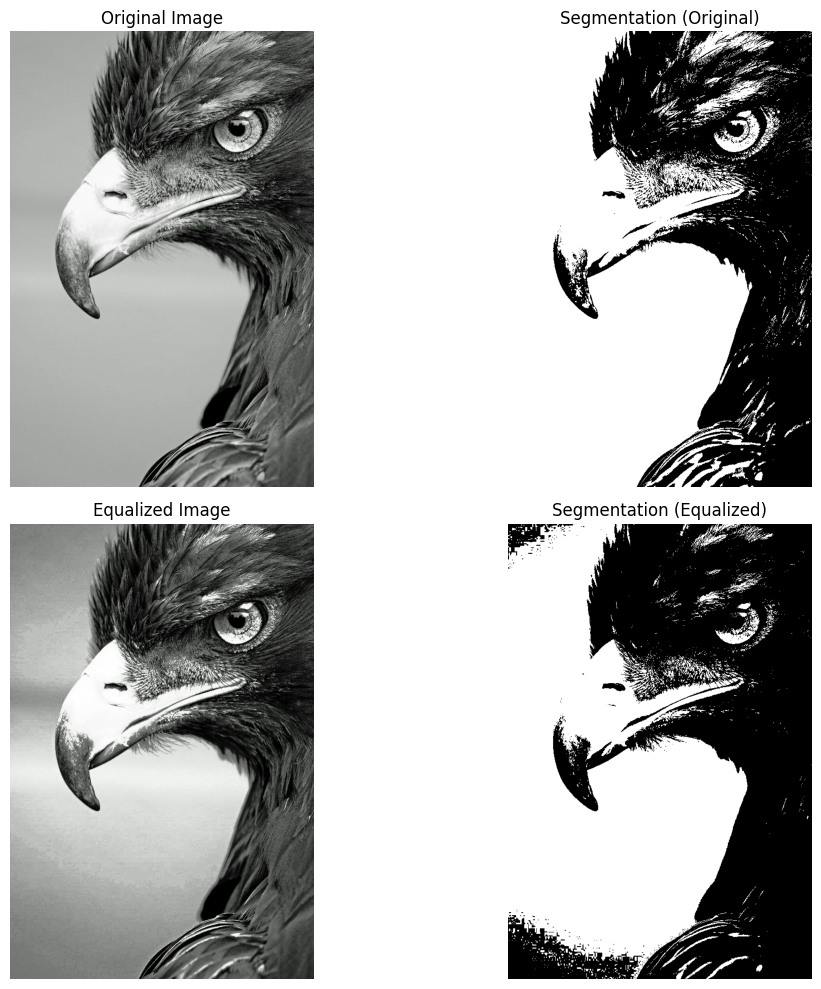

In [46]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to display images and segmentation results
def display_segmentation_results(original_image, equalized_image, original_segmentation, equalized_segmentation):
    plt.figure(figsize=(12, 10))
    
    # Original Image and Segmentation
    plt.subplot(2, 2, 1)
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(2, 2, 2)
    plt.imshow(original_segmentation, cmap='gray')
    plt.title('Segmentation (Original)')
    plt.axis('off')
    
    # Equalized Image and Segmentation
    plt.subplot(2, 2, 3)
    plt.imshow(cv2.cvtColor(equalized_image, cv2.COLOR_BGR2RGB))
    plt.title('Equalized Image')
    plt.axis('off')
    
    plt.subplot(2, 2, 4)
    plt.imshow(equalized_segmentation, cmap='gray')
    plt.title('Segmentation (Equalized)')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Function to apply histogram equalization
def apply_histogram_equalization(image):
    if len(image.shape) == 3:  # Color image
        # Convert to YUV color space
        yuv_image = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
        # Apply histogram equalization on the Y channel
        yuv_image[:,:,0] = cv2.equalizeHist(yuv_image[:,:,0])
        # Convert back to BGR color space
        equalized_image = cv2.cvtColor(yuv_image, cv2.COLOR_YUV2BGR)
    else:  # Grayscale image
        equalized_image = cv2.equalizeHist(image)
    
    return equalized_image

# Function for basic threshold-based segmentation
def segment_image(image):
    # Convert image to grayscale if it is color
    if len(image.shape) == 3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray_image = image
    
    # Apply a simple binary threshold
    _, segmented_image = cv2.threshold(gray_image, 128, 255, cv2.THRESH_BINARY)
    
    return segmented_image

# Load the original image
image_path = 'eagle.jpg'  # Replace with your image path
original_image = cv2.imread(image_path)

if original_image is None:
    print("Error: Image could not be loaded. Please check the path.")
else:
    # Perform segmentation on the original image
    original_segmentation = segment_image(original_image)
    
    # Apply histogram equalization
    equalized_image = apply_histogram_equalization(original_image)
    
    # Perform segmentation on the equalized image
    equalized_segmentation = segment_image(equalized_image)
    
    # Display the results
    display_segmentation_results(original_image, equalized_image, original_segmentation, equalized_segmentation)


#### Impact on Segmentation Accuracy:
Improved Feature Visibility: Histogram equalization can enhance subtle details, potentially leading to better segmentation outcomes by making features more distinct.

Increased Noise and Artifacts: The process may also amplify noise or artifacts, which could negatively affect segmentation accuracy.

#### Effectiveness:

Low Contrast Images: In images with low contrast, equalization can greatly improve the visibility of features, thereby boosting segmentation performance.
High Contrast Images: For images that already have high contrast, the benefits of equalization may be minimal, and there is a greater risk of introducing artifacts.